In [155]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
%matplotlib inline

data = pd.read_csv('diabetic_data.csv')

In [177]:
# data.head()
# data.info()

## 1 Data cleaning and exploration

In [157]:
# since more than 95% obeservations in the weight column is question mark, it need to be removed.
# the two id number also need to be removed.
# diag_1,2,3 is categorical column and contain too many different categories, 
# therefore it will be removed for now, since not sure if they can be converted to numerical number due to lack of medical knowledge
# since we have enough data, so we will just drop all the rows with '?'.

data.drop(columns = ['weight', 'encounter_id', 'patient_nbr','diag_1',
       'diag_2', 'diag_3' ], inplace=True)

data.replace('?', np.nan, inplace=True)
data.dropna(inplace=True)

data_numeric = data[['admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']]

data_object = data[['race', 'gender', 'age','payer_code', 'medical_specialty','max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed']]

target = data['readmitted']

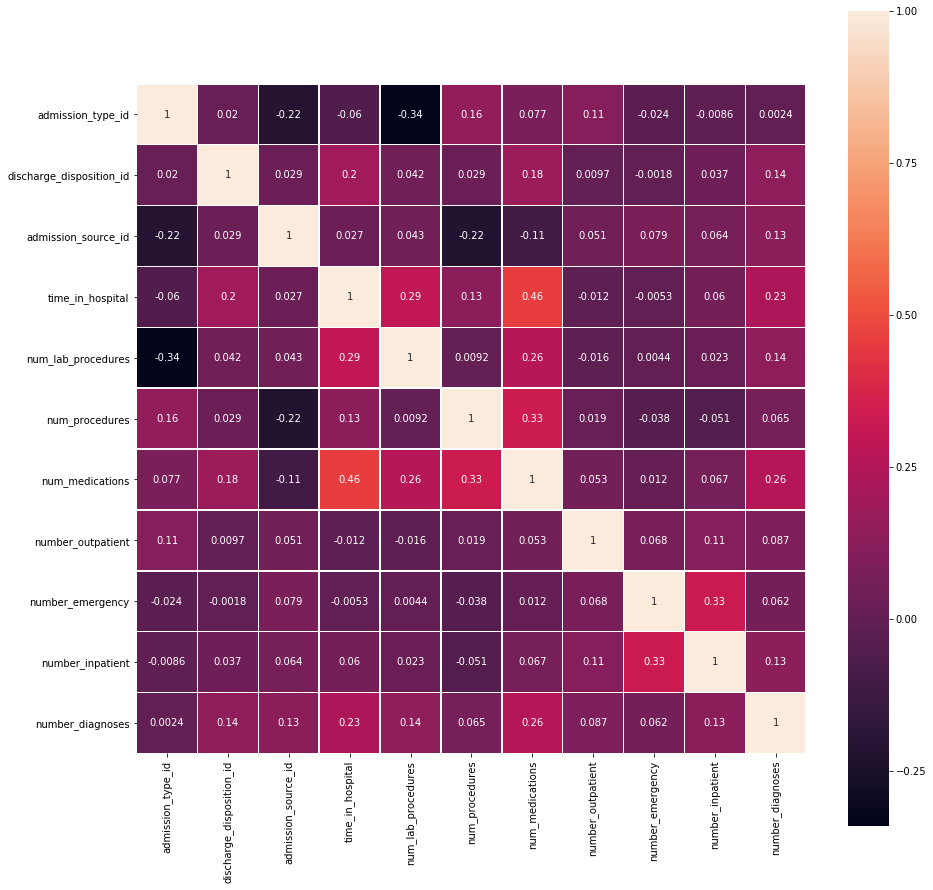

In [158]:
corr = data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, square=True, annot=True, linewidths=.5)

###### looks like all the numerical variables are not correlated, therefore we do not need to remove any variables for now

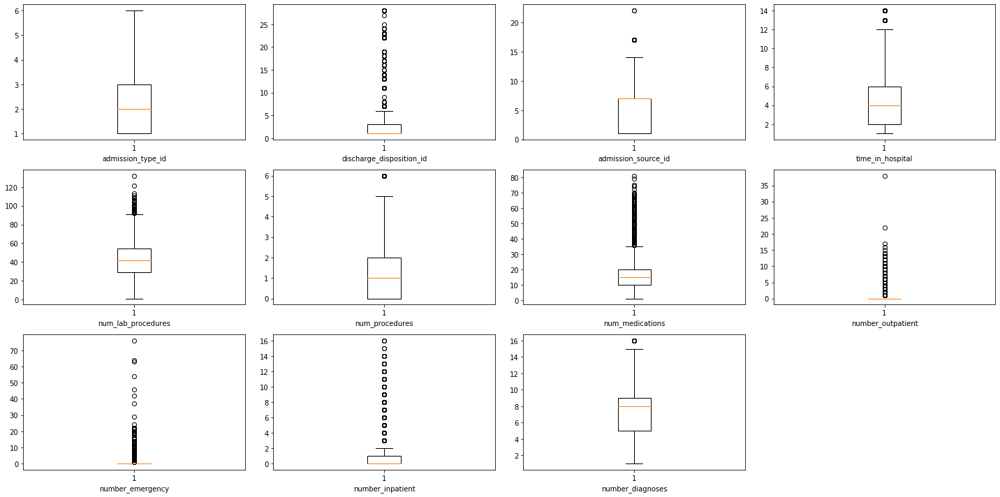

In [159]:
plt.figure(figsize=(20,10))
for i in range(0, len(data_numeric.columns)):
    plt.subplot(3,4,i+1)
    plt.boxplot(data_numeric[data_numeric.columns[i]])
    plt.xlabel(data_numeric.columns[i])
plt.tight_layout()

###### most of  the numerical variables have outliers, so we need to use winsorization to remove outliers

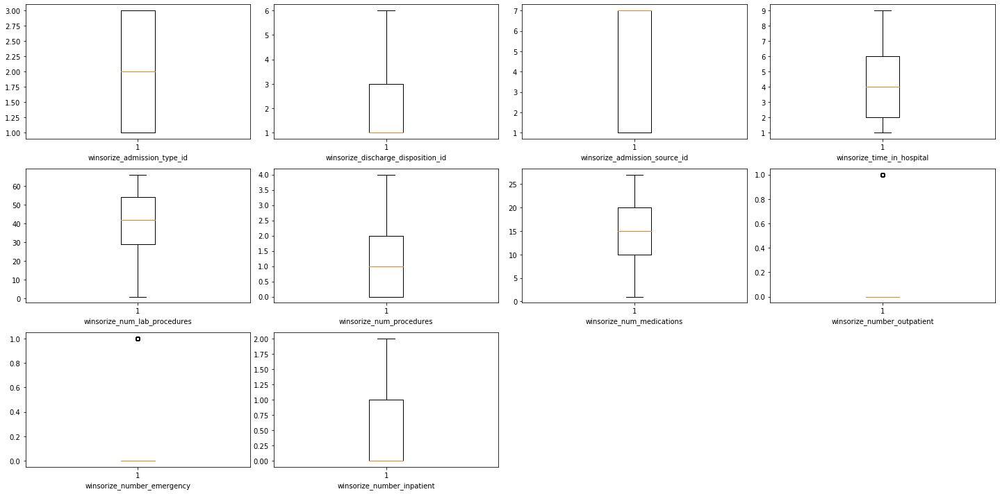

In [160]:
from scipy.stats.mstats import winsorize
columns = data_numeric.columns

plt.figure(figsize=(20,10))
for i in range(0,10):
    plt.subplot(3,4,i+1)
    data['winsorize_{}'.format(columns[i])] = winsorize(data[columns[i]], (0, 0.1))
    plt.boxplot(data['winsorize_{}'.format(columns[i])])
    plt.xlabel('winsorize_{}'.format(columns[i]))
plt.tight_layout()

###### after applying winsorization, we have remove 10% of data point from the high values.

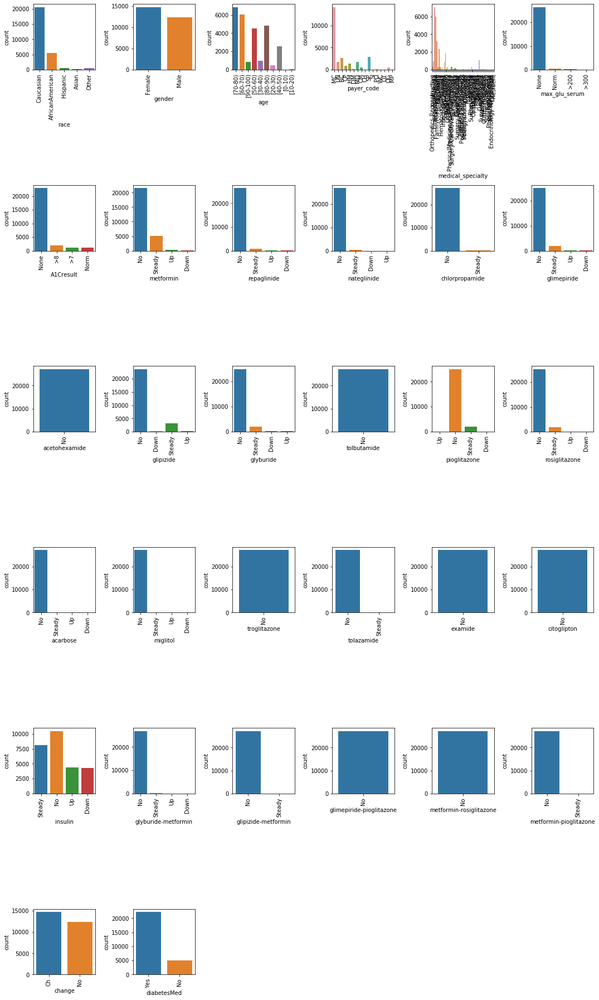

In [161]:
plt.figure(figsize=(15,25))

for i in range(0, len(data_object.columns)):
    plt.subplot(6,6,i+1)
    sns.countplot(data_object[data_object.columns[i]])
    plt.xticks(rotation = 90)
plt.tight_layout()

###### 'acetohexamide', 'tolbutamide', 'troglitazone','examide', 'citoglipton', 'glimepiride-pioglitazone', 'metformin-rosiglitazone'  only have one category, so we could remove this two columns

In [162]:
data_object.drop(columns = ['acetohexamide', 'tolbutamide', 'troglitazone',
                            'examide', 'citoglipton', 'glimepiride-pioglitazone', 
                            'metformin-rosiglitazone'], inplace=True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


###### convert all the categorical columns into dummies and combine with the numerical data set

In [303]:
data_numeric_win = data[['winsorize_admission_type_id', 'winsorize_discharge_disposition_id',
       'winsorize_admission_source_id', 'winsorize_time_in_hospital',
       'winsorize_num_lab_procedures', 'winsorize_num_procedures',
       'winsorize_num_medications', 'winsorize_number_outpatient',
       'winsorize_number_emergency', 'winsorize_number_inpatient']]

data_object_dummy = pd.get_dummies(data_object, drop_first=True)

df_features = pd.concat([data_numeric_win, data_object_dummy], axis=1)
target = data['readmitted']

## 2 Prepare features 

In [304]:
x = df_features
# print(target.unique())
target_id = {'NO': 0, '>30': 1, '<30': 2}
# data['readmitted'] = data['readmitted'].replace(target_id)
y = data['readmitted']

In [305]:
s = np.arange(27140)
x.set_index([s], inplace=True)
y = y.reset_index()
y.drop(columns=['index'], inplace=True)

## 3 PCA - Kmean, hierarchical, and Gaussian mixture

##### PCA

In [414]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

x = StandardScaler().fit_transform(x)
pca = PCA(n_components=20)
result = pca.fit_transform(x)
pca.explained_variance_ratio_

array([0.02394592, 0.02076336, 0.01815879, 0.01636894, 0.01589978,
       0.01551223, 0.01507846, 0.01469058, 0.01448397, 0.0139933 ,
       0.01372176, 0.01364827, 0.01339712, 0.01218515, 0.01174455,
       0.01096136, 0.01036081, 0.00987272, 0.00938447, 0.0087164 ])

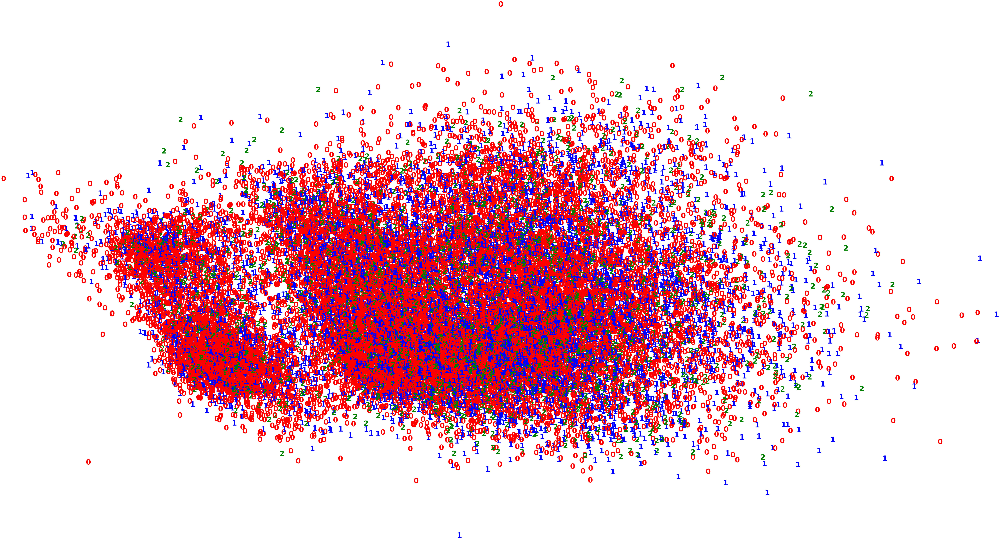

In [415]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(result[i, 0], result[i, 1], str(y.readmitted[i]),
             color=colours[int(y.readmitted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

######  From the graph above, it is impossible to distinguish different labels by a two dimensional representation. It is indicate that pca may not a good dimension reduction method for this data set. But, we will still try to use for prediction

##### KMean

In [397]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans

kmean = KMeans(n_clusters=3, random_state=123)
kmean.fit(result)
y_pred = kmean.predict(result)

In [398]:
from sklearn import datasets, metrics
def rand_index_score(grount_truths, predictions):
    tp_plus_fp = scipy.special.comb(np.bincount(grount_truths), 2).sum()
    tp_plus_fn = scipy.special.comb(np.bincount(grount_truths), 2).sum()
    A = np.c_[(grount_truths, predictions)]
    tp = sum(scipy.special.comb(np.bincount(A[A[:, 0] == i, 1]), 2).sum()
             for i in set(grount_truths))
    fp = tp_plus_fp - tp
    fn = tp_plus_fn - tp
    tn = scipy.special.comb(len(A), 2) - tp - fp - fn
    return (tp + tn) / (tp + fp + fn + tn)

print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.555458993375706
0.0015616451286311814


###### Even with 20 premary components, it still can not represent the original variance very well. From the RI and ARI test, it seems using kmean produce a bad prediction, since ARI is very close to 0 which indicate the randomness prediction

In [399]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=3)

y_pred = agg_cluster.fit_predict(result)

In [400]:
print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.6904641768489919
-0.010149480448025713


###### the hierarchical approach also does work very well for predicting based on the RI and ARI test

In [401]:
from sklearn.mixture import GaussianMixture

gmm_cluster = GaussianMixture(n_components=3, random_state=123)
y_pred = gmm_cluster.fit_predict(result)

In [402]:
print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.741709965913358
0.0006142482424131226


###### Based on the ARI test, it still show a randomness of the prediction. However, the RI score increased compare to Kmean and Hierachical

## 4 UMAP - Kmean, hierarchical, and Gaussian mixture

##### UMAP

In [405]:
import umap
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(x)

C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))
C:\ProgramData\Anaconda3\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 45 separate connected components using meta-embedding (experimental)
  n_components


##### KMean

In [408]:
kmean.fit(umap_results)
y_pred = kmean.predict(umap_results)

print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.4154843444552476
0.0007928647892412145


##### Hierarchical

In [409]:
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=3)

y_pred = agg_cluster.fit_predict(umap_results)

print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.4191343546663329
-0.0006518067712338114


##### Gaussian

In [411]:
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
y_pred = gmm_cluster.fit_predict(umap_results)

print(rand_index_score(y.readmitted, y_pred))
print(metrics.adjusted_rand_score(y.readmitted, y_pred))

0.4212713972878456
0.001185669763646156


###### Overall, with UMAP dimensionality reduction, all three different algrithms seems not work very well for prediction

In [412]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y_pred[i]),
             color=colours[int(y.readmitted[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###### From the plot above, it is clearly that UMAP can not clustering different group of data very well, therefore all the prediction tend to be randomness

## 5 Conclusion

##### For both PCA and UMAP dimensionality reduction methods can not represent the original data variance or clustering the data very well after applying dimension reduction. With different clustering algrithms, it seems Gaussian with pca shows the best RI score, however it still tend to be random prediction based on the ARI test. 

##### Since, all the combinations of calculation seem not work very well, it may not worth to try passing different parameters into function to make relatively minor changes on the prediction.

##### For further improvement, we may need to go back to the data exploration and may create some new variables which may more impact on the predcition. Since, we do have the labels in this data set, so we may also could try some supervised learning instead.